In [1]:
from Config import *
from Dataset import *
from Experiments import *
from Metric import *
from Model import *
from Utils import *
from FID import *
from Train import *

import gc


class set_args:
    def __init__(self):
        self.seed = 5
        self.state = 'train'
        self.epochs = 150 # training epochs
        self.batch_size = 80
        self.dataset = 'MNIST'#'MNIST'#'CIFAR10' 
        self.split_class= [0]

        #Load different model if TRUE
        self.load_different_model = False
        self.load_training_checkpoint = 30 #30,#200
        self.load_rd_training_checkpoint = 150

        self.sample_dir = 'Result'
        self.checkpoint_dir = 'Result'
        self.M = [0]
        self.I = [0]

        #Reduce training sample
        self.rd = 0.05
        self.training_anchor_num = 10 # training_anchor_num=200
        self.testing_anchor_num = 100 # testing_anchor_num=2500
        self.metric = 'L2'
        

        self.save_weight_dir = 'Result/CheckpointsMNIST/'

        
    
directory_init()

args = set_args()
seed_everything(args.seed) 


"""Merge both these"""
model_config = set_config(args, custom_dataset=args.dataset) 

model, sampler, trainer = model_init(args, model_config)

# FID

block_idx = InceptionV3.BLOCK_INDEX_BY_DIM[2048]
InceptionV3_model = InceptionV3([block_idx])
InceptionV3_model=InceptionV3_model.cuda()



1.13.1
Config : MNIST
Config : haha
loading model : c0_ckpt_30_.pt ......


c:\Users\user\Desktop\DDPM_XAI\Utils.py:799: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(os.path.join(


model load weight done.
update Sampler ...... done
update Trainer ...... done


c:\Users\user\.conda\envs\FID\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\user\.conda\envs\FID\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [10]:
import torch
import torch.nn as nn
import torch.optim as optim

i = torch.randn((1, 3, 32, 32), requires_grad=True, device='cuda')  

optimizer = optim.Adam([i], lr=1e-4)
loss_fn = nn.MSELoss()  

for epoch in range(1):
    optimizer.zero_grad()
    with torch.no_grad():
        x_reconstructed = sampler(i)  # DDPM 生成影像
    loss = loss_fn(x_reconstructed, train_dataset[0][0].to('cuda'))  
    loss.backward()  
    optimizer.step()  

    print(f"epoch {epoch}, Loss: {loss.item()}")



c:\Users\user\.conda\envs\FID\lib\site-packages\torch\nn\modules\loss.py:538: UserWarning: Using a target size (torch.Size([3, 32, 32])) that is different to the input size (torch.Size([1, 3, 32, 32])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


RuntimeError: element 0 of tensors does not require grad and does not have a grad_fn

In [12]:
x_reconstructed

tensor([[[[-7.6968e-03, -2.6840e-03, -4.1203e-03,  ..., -4.7201e-03,
            1.1140e-03,  7.0588e-03],
          [-1.4816e-03, -3.0619e-03, -2.2085e-03,  ...,  9.0958e-06,
           -1.6804e-03,  5.0532e-03],
          [ 3.9023e-03, -4.0606e-03, -3.4237e-03,  ..., -1.1532e-03,
            2.7193e-03, -2.8761e-03],
          ...,
          [-9.7798e-04,  2.1160e-05, -4.1299e-03,  ...,  2.5243e-03,
           -7.0687e-03,  1.3321e-02],
          [ 1.4226e-03,  1.3396e-03, -5.4869e-03,  ...,  1.9263e-03,
            2.9722e-03,  1.7884e-03],
          [-7.7674e-03,  4.6992e-04,  5.8658e-03,  ...,  1.2343e-03,
           -4.5519e-03,  2.2295e-03]],

         [[ 4.1109e-03, -1.6783e-03, -2.5543e-03,  ...,  8.6172e-03,
           -3.1845e-03, -5.4980e-03],
          [-5.5142e-03, -4.7690e-03, -8.0936e-04,  ...,  3.5630e-03,
            1.1172e-04, -7.1250e-03],
          [ 5.6679e-03,  1.4986e-03, -5.1411e-03,  ...,  3.7311e-04,
           -7.2775e-03, -6.4949e-03],
          ...,
     

In [6]:
dt_train = CUSTOM_DATASET(args, split=True)
train_dataset, _ = dt_train.load_dataset(custom_trasform=True)

In [4]:
find_optimal_noise(sampler, train_dataset[0])

AttributeError: 'tuple' object has no attribute 'size'

In [6]:
train_dataset[0]

(tensor([[[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],
 
         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]],
 
         [[0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          ...,
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.],
          [0., 0., 0.,  ..., 0., 0., 0.]]]),
 0)

Creating anchor dataframe ......
Create anchor dataframe Done ......
Experiment 1 Done ......
Distance Metric L1 Computing ... start


c:\Users\user\Desktop\DDPM_XAI\Experiments.py:293: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[0], data=concat_df, x='label',y='fd_h', hue_order=hue_order, palette=palette, order=hue_order)
c:\Users\user\Desktop\DDPM_XAI\Experiments.py:294: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[0].legend(loc='upper left', bbox_to_anchor=(1, 1))  # Moves the legend to the right
c:\Users\user\Desktop\DDPM_XAI\Experiments.py:302: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[1], data=concat_df, x='label',y='fd_ef', hue_order=hue_order, palette=palette, or

experiment 2 Done ......


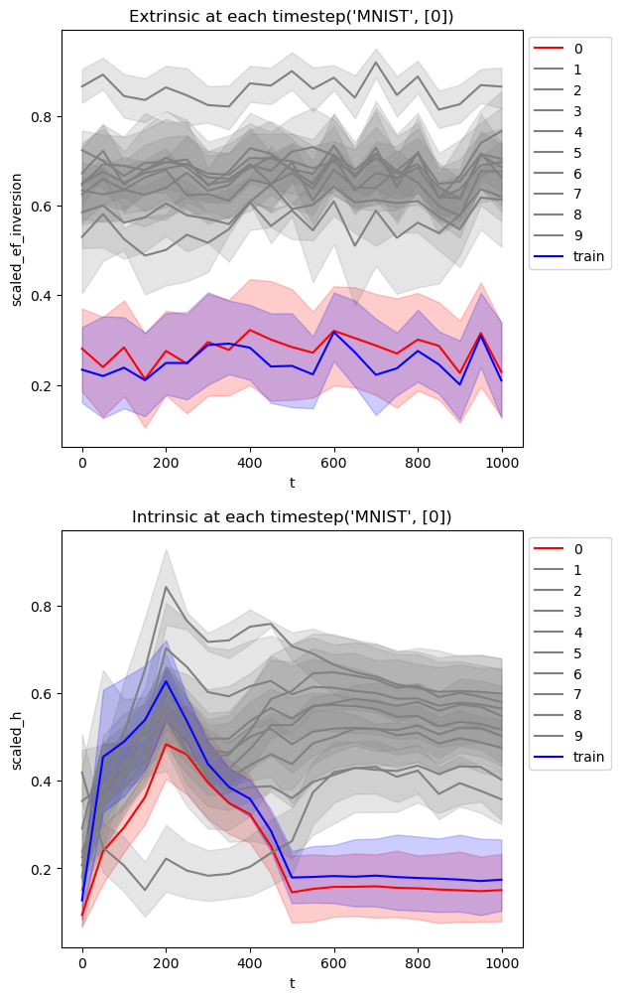

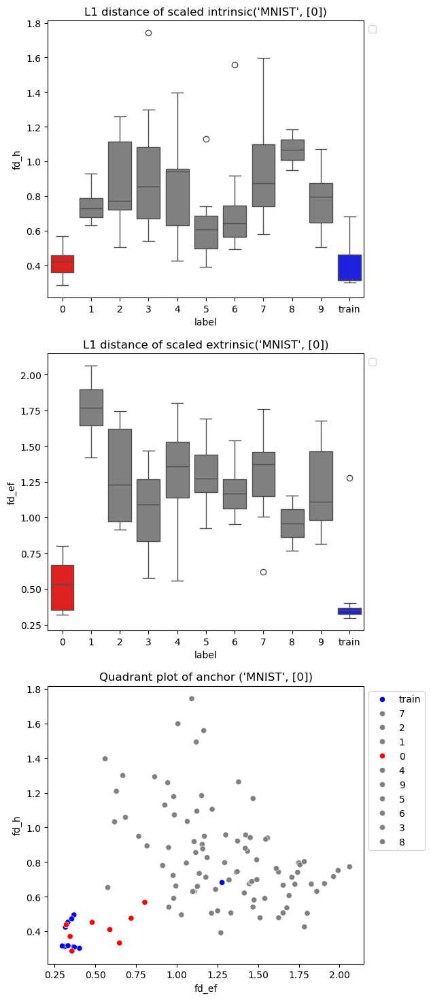

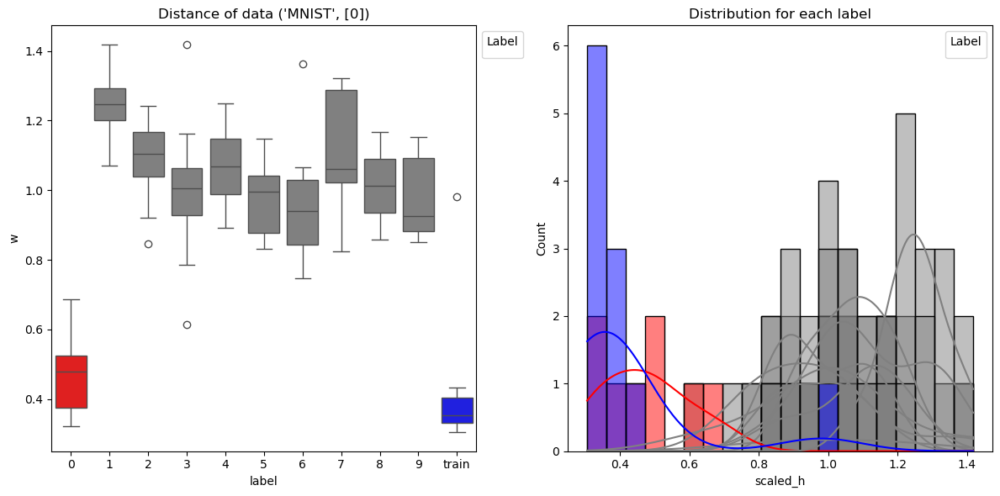

Distance Metric L2 Computing ... start


c:\Users\user\Desktop\DDPM_XAI\Experiments.py:293: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[0], data=concat_df, x='label',y='fd_h', hue_order=hue_order, palette=palette, order=hue_order)
c:\Users\user\Desktop\DDPM_XAI\Experiments.py:294: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[0].legend(loc='upper left', bbox_to_anchor=(1, 1))  # Moves the legend to the right
c:\Users\user\Desktop\DDPM_XAI\Experiments.py:302: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[1], data=concat_df, x='label',y='fd_ef', hue_order=hue_order, palette=palette, or

experiment 2 Done ......


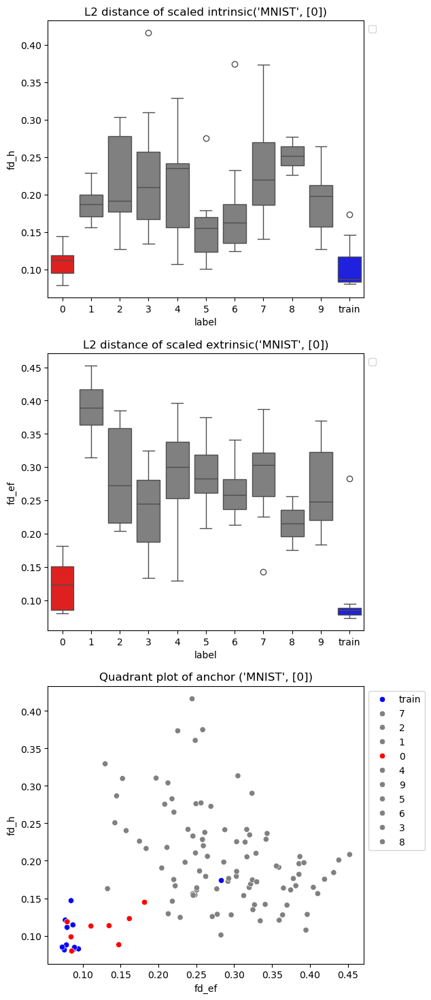

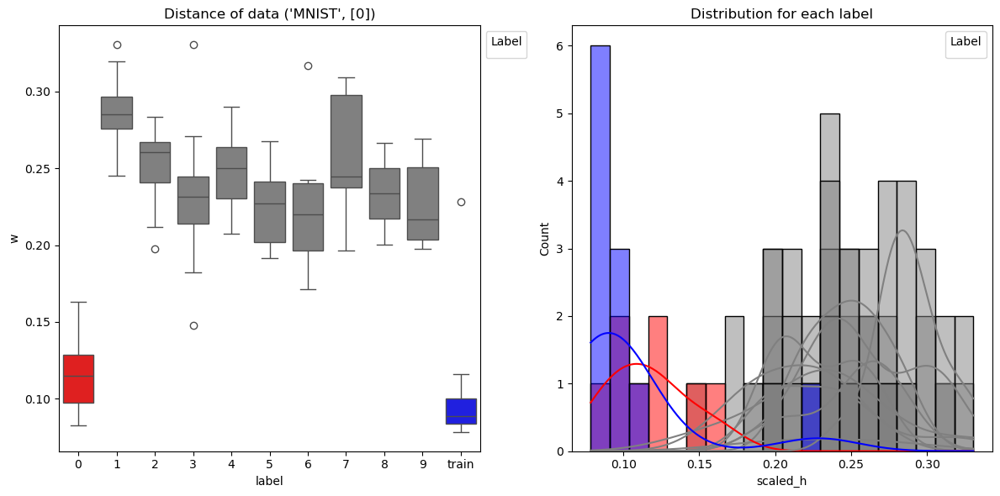

Distance Metric Linf Computing ... start


c:\Users\user\Desktop\DDPM_XAI\Experiments.py:293: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[0], data=concat_df, x='label',y='fd_h', hue_order=hue_order, palette=palette, order=hue_order)
c:\Users\user\Desktop\DDPM_XAI\Experiments.py:294: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[0].legend(loc='upper left', bbox_to_anchor=(1, 1))  # Moves the legend to the right
c:\Users\user\Desktop\DDPM_XAI\Experiments.py:302: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[1], data=concat_df, x='label',y='fd_ef', hue_order=hue_order, palette=palette, or

experiment 2 Done ......


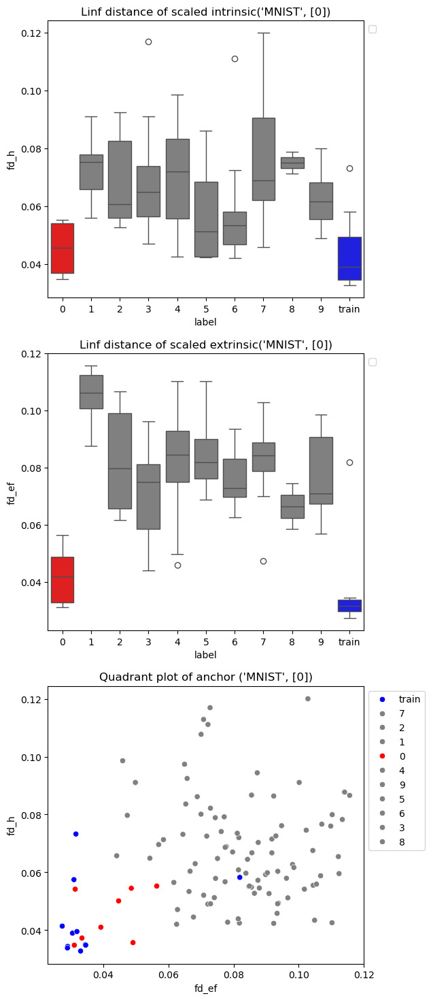

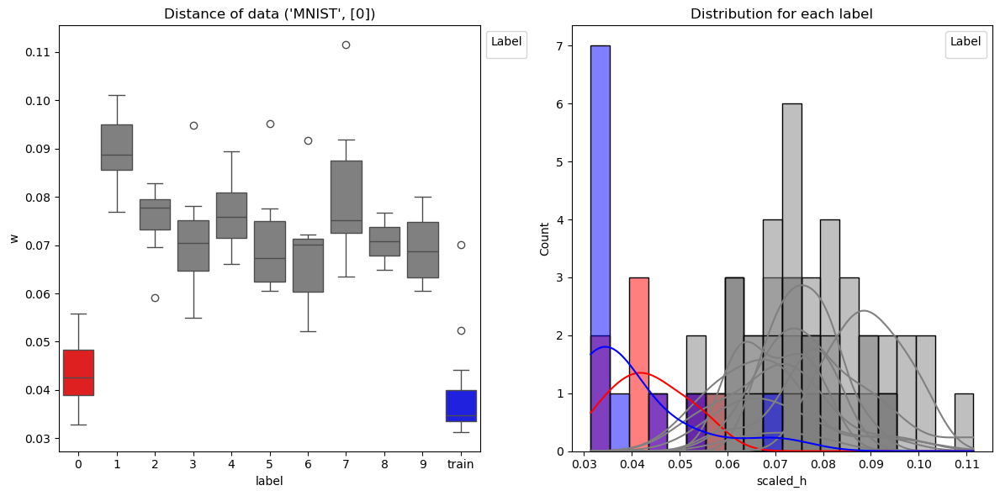

Distance Metric Frechet Computing ... start


c:\Users\user\Desktop\DDPM_XAI\Experiments.py:293: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[0], data=concat_df, x='label',y='fd_h', hue_order=hue_order, palette=palette, order=hue_order)
c:\Users\user\Desktop\DDPM_XAI\Experiments.py:294: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[0].legend(loc='upper left', bbox_to_anchor=(1, 1))  # Moves the legend to the right
c:\Users\user\Desktop\DDPM_XAI\Experiments.py:302: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[1], data=concat_df, x='label',y='fd_ef', hue_order=hue_order, palette=palette, or

experiment 2 Done ......


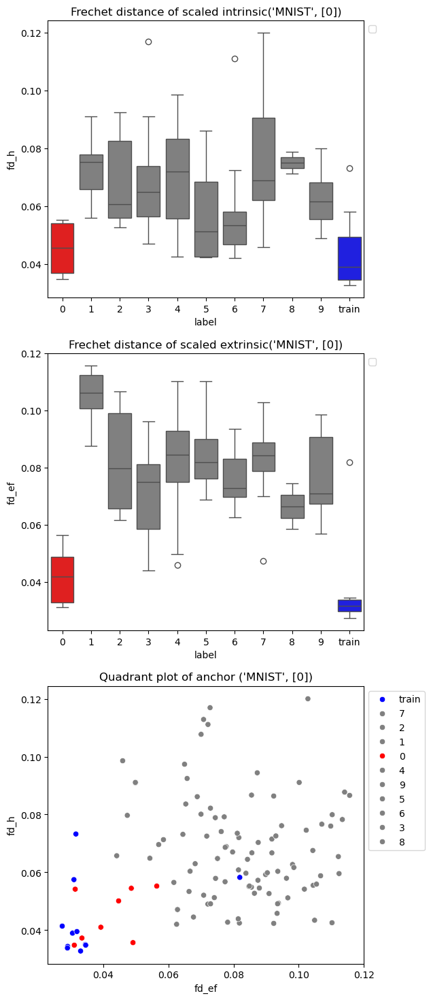

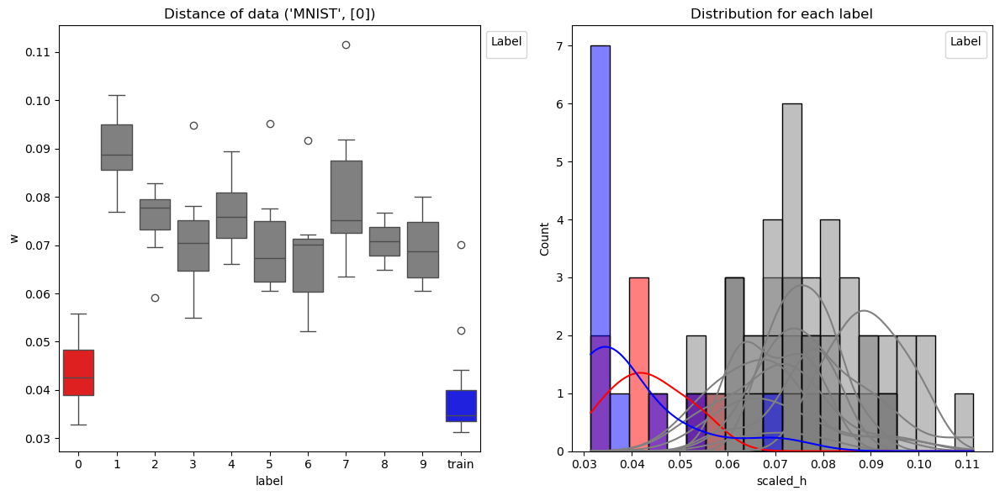

experiment 2 and 3 Done ......


'\nfor stage in range(15, 25):\n    for rd_mode in [\'HIHE\', \'Other\', \'Random\']:\n        train_new(args, reduced_sort_idx, model_config, stage, rd_mode)\nprint("Training reduced model Done ......")\n'

In [2]:

"""Handle these afterward"""
#h_info_sampledImgs = sampler.load_h_information()
#xt_info_sampledImgs = sampler.load_xt_information()



expriment1 = Experiment_1(args, model_config, model, sampler, trainer)
expriment1.plot_sim()

df_anchor = expriment1.df_anchor

print("Experiment 1 Done ......")

for dis_metric in ['L1', 'L2', 'Linf', 'Frechet']:
    args.metric = dis_metric
    print(f'Distance Metric {args.metric} Computing ... start')
    exp2 = Experiment_2(args, model_config, df_anchor, metric=args.metric)
    train_mean_anchor = exp2.anchor_train_mean_df
    exp2.plot_sim()

    print("experiment 2 Done ......")

    exp3 = Experiment_3(args, model_config, exp2.anchor_train_mean_df, exp2.anchor_test_mean_df)
    exp3.plot()

print("experiment 2 and 3 Done ......")

# create indices
reduced_sort_idx = create_reduce_idx(args, train_mean_anchor)
"""
for stage in range(15, 25):
    for rd_mode in ['HIHE', 'Other', 'Random']:
        train_new(args, reduced_sort_idx, model_config, stage, rd_mode)
print("Training reduced model Done ......")
"""

In [6]:
df_anchor

,idx,is_train,label,t,ef_inversion,h,kld,scaled_ef_inversion,scaled_h,scaled_kld
0,0,False,7,0,6.3368,0.4861,16.196,0.744701,0.406534,0.554562
1,1,False,2,0,6.2672,0.472,16.4283,0.610597,0.150635,0.690338
2,2,False,1,0,6.4215,0.4902,16.7021,0.907900,0.480944,0.850371
3,3,False,0,0,6.0819,0.4724,15.7936,0.253565,0.157895,0.319364
4,4,False,4,0,6.3086,0.4756,16.4352,0.690366,0.215971,0.694371
...,...,...,...,...,...,...,...,...,...,...
2347,6,True,train,999,6.0283,0.0911,15.571,0.100488,0.303085,0.186963
2348,7,True,train,999,6.2856,0.1045,16.6575,0.671251,0.546279,0.883348
2349,8,True,train,999,6.0098,0.0804,15.7786,0.059450,0.108893,0.320023
2350,9,True,train,999,6.1068,0.0816,15.8583,0.274623,0.130672,0.371106


In [6]:
exp2.anchor_test_mean_df

,idx,label,scaled_h,scaled_ef_inversion,fd_h,fd_ef
0,0,7,0.473163,0.750795,0.056006,0.089368
1,1,2,0.647865,0.655133,0.085104,0.075750
2,2,1,0.216368,0.935333,0.082496,0.114119
3,3,0,0.262165,0.209734,0.035913,0.029903
4,4,4,0.359346,0.739572,0.056687,0.083631
...,...,...,...,...,...,...
96,96,1,0.327328,0.906844,0.061350,0.109099
97,97,7,0.766936,0.634582,0.105101,0.072174
98,98,6,0.445746,0.613577,0.052619,0.070916
99,99,9,0.575850,0.572153,0.079475,0.066883


In [41]:
ha = df_anchor[df_anchor['label']=='5']
ha[ha['t']==999]['scaled_h'].mean()

0.4692763433356595

In [42]:
df_anchor_t = df_anchor[df_anchor['is_train']==True]
df_anchor_f = df_anchor[df_anchor['is_train']==False].groupby(['t'])[['scaled_h','scaled_ef_inversion']].mean()
df_anchor_1 = df_anchor[df_anchor['label']=='1']

In [88]:
df_anchor_t0 = df_anchor_t[df_anchor_t['idx'].isin([i for i in range(10)])]

In [89]:
df_anchor_t0.groupby(['t'])[['scaled_h','scaled_ef_inversion']].mean()

,scaled_h,scaled_ef_inversion
t,,
0,0.472839,0.456086
50,0.349385,0.403930
100,0.386948,0.394972
150,0.385493,0.422782
200,0.397788,0.403472
250,0.399110,0.444590
300,0.393059,0.421383
350,0.387639,0.401137
400,0.443474,0.408537


<Axes: xlabel='t', ylabel='scaled_h'>

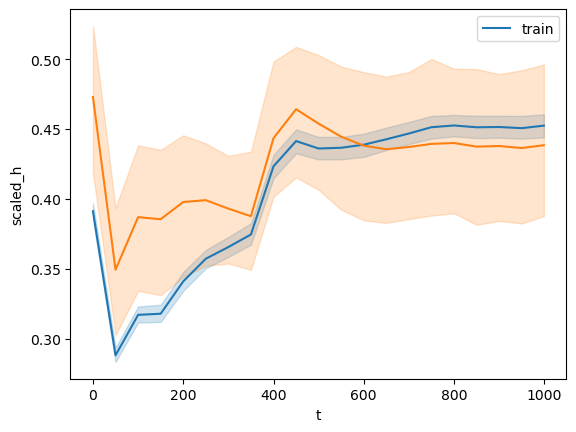

In [90]:
#sns.lineplot(data=df_anchor_f, x='t',y='scaled_h',hue='label')
sns.lineplot(data=df_anchor_t, x='t',y='scaled_h',hue='label')
sns.lineplot(data=df_anchor_t0, x='t',y='scaled_h')


In [11]:
df_anchor_t = df_anchor[df_anchor['is_train'] == True]
df_anchor_nt = df_anchor[df_anchor['is_train'] == False]

In [12]:
df_anchor_t.groupby(['t'])[['scaled_h','scaled_ef_inversion']].mean()

,scaled_h,scaled_ef_inversion
t,,
0,0.301551,0.418464
50,0.383120,0.471727
100,0.301215,0.436396
150,0.252733,0.458406
200,0.263598,0.393563
250,0.292680,0.461759
300,0.339973,0.442010
350,0.404719,0.420197
400,0.469325,0.426400


In [3]:
class t_Experiment_2:
    """Calculate Frechet Distance"""
    def __init__(self, args, model_config, experiment_1_df, metric):
        self.args = args
        self.metric = metric
        self.exp1_df = experiment_1_df.copy()
        df_istrain = experiment_1_df[experiment_1_df['is_train'] == True]
        df_istest = experiment_1_df[experiment_1_df['is_train'] == False]
        #df_is_0 = df_istest[df_istest['label'] == '0']
        #df_is_1 = df_istest[df_istest['label'] == '1']
        #df_is_2 = df_istest[df_istest['label'] == '2']
        #df_is_3 = df_istest[df_istest['label'] == '3']
        #df_is_4 = df_istest[df_istest['label'] == '4']
        #df_is_5 = df_istest[df_istest['label'] == '5']
        #df_is_6 = df_istest[df_istest['label'] == '6']
        #df_is_7 = df_istest[df_istest['label'] == '7']
        #df_is_8 = df_istest[df_istest['label'] == '8']
        #df_is_9 = df_istest[df_istest['label'] == '9']
        
        (
            self.anchor_train_mean_df,
            self.i_mean,
            self.i_var,
            self.e_mean,
            self.e_var
        ) = self._calc_asc_weight_df(df_istrain, df_istrain, metric=metric)
        
        self.anchor_test_mean_df, _, _, _, _ = self._calc_asc_weight_df(df_istest, df_istrain,metric=metric)
        #self.anchor_test0_mean_df, _, _, _, _ = self._calc_asc_weight_df(df_is_0, df_istrain,metric=metric)
        #self.anchor_test1_mean_df, _, _, _, _ = self._calc_asc_weight_df(df_is_1, df_istrain,metric=metric)
        #self.anchor_test2_mean_df, _, _, _, _ = self._calc_asc_weight_df(df_is_2, df_istrain,metric=metric)
        #self.anchor_test3_mean_df, _, _, _, _ = self._calc_asc_weight_df(df_is_3, df_istrain,metric=metric)

        
   
    
    def plot_sim(self):
        args = self.args

        palette = {
            str(i): 'red' if str(i) == str(args.split_class[0]) else 'grey'
            for i in range(10)
        }
        #palette['train'] = 'blue'  # Adding 'train' key separately
        #hue_order = ['0','1','2','3','4','5','6','7','8','9','train']

        concat_df = pd.concat([self.anchor_train_mean_df, self.anchor_test_mean_df],axis=0).reset_index()
        concat_df['label_group'] = concat_df['label'].apply(lambda x: 'train' if x == 'train' else 'other')

    # 設定顏色
        palette = {'train': 'blue', 'other': 'grey'}
        hue_order = ['train', 'other']
        #concat_df = pd.concat([self.anchor_train_mean_df, self.anchor_test1_mean_df],axis=0).reset_index()


        fig, axes = plt.subplots(3, 1, figsize=(6, 18))  # Adjust figure size as needed

        sns.boxplot(ax=axes[0], data=concat_df, x='label_group',y='fd_h', hue_order=hue_order, palette=palette, order=hue_order)
        axes[0].legend(loc='upper left', bbox_to_anchor=(1, 1))  # Moves the legend to the right
        axes[0].set_title(f'{self.metric} distance of scaled intrinsic{args.dataset,args.split_class}')
        plt.savefig(f'Result/Results{self.args.dataset}/{self.metric}_h_{self.args.dataset}_{self.args.split_class}.png')


        #hue_order = ['0','1','2','3','4','5','6','7','8','9']
        #hue_order = ['0','1','2','3','4','5','6','7','8','9','train']

        sns.boxplot(ax=axes[1], data=concat_df, x='label_group',y='fd_ef', hue_order=hue_order, palette=palette, order=hue_order)
        axes[1].legend(loc='upper left', bbox_to_anchor=(1, 1))  # Moves the legend to the right
        axes[1].set_title(f'{self.metric} distance of scaled extrinsic{args.dataset,args.split_class}')
        plt.savefig(f'Result/Results{self.args.dataset}/{self.metric}_ex_{self.args.dataset}_{self.args.split_class}.png')

        sns.scatterplot(data=concat_df, x="fd_ef", y="fd_h", hue="label_group", palette=palette)
        axes[2].legend(loc='upper left', bbox_to_anchor=(1, 1))  # Moves the legend to the right
        axes[2].set_title(f'Quadrant plot of anchor {args.dataset,args.split_class}')
        plt.savefig(f'Result/Results{self.args.dataset}/scatter_plot_{self.metric}_{self.args.dataset}_{self.args.split_class}.png')

        
    def _calc_asc_weight_df(self, input_df, compared_df, set_compare_num=80, metric='L2'):
        fd_h_lst = []
        fd_ef_lst = []
        label_lst = []
        compare_t = input_df['t'].unique()
        input_df = input_df.sort_values(by=['label'])

        #num_train = len(input_df['idx'].unique())

        #calculate training data
        anchor_cnt = 0
        anchor_set = []


        for i in input_df['idx'].unique():
            anchor_cnt += 1
            anchor_set.append(i)
            
            if anchor_cnt < 1:
                continue 
            
            
            anchor_cnt = 0

            fd_h = 0
            fd_ef = 0

            df_istrain_i = input_df[input_df['idx'].isin(anchor_set)].groupby(['t'])[['scaled_h','scaled_ef_inversion']].mean()
            is_train_i_h_arr = np.array(df_istrain_i['scaled_h'])
            is_train_i_ef_arr = np.array(df_istrain_i['scaled_ef_inversion'])
            compare_h_P = np.vstack([compare_t, is_train_i_h_arr]).T
            compare_ef_P = np.vstack([compare_t, is_train_i_ef_arr]).T

            #for counter, j in enumerate(compared_df['idx'].unique()):
                #if counter > set_compare_num:
                    #break
            
            df_istrain_j = compared_df.groupby(['t'])[['scaled_h','scaled_ef_inversion']].mean()
            
            #df_istrain_j = compared_df[compared_df['idx']==j]
            is_train_j_h_arr = np.array(df_istrain_j['scaled_h'])
            is_train_j_ef_arr = np.array(df_istrain_j['scaled_ef_inversion'])
            compare_h_Q = np.vstack([compare_t, is_train_j_h_arr]).T
            compare_ef_Q = np.vstack([compare_t, is_train_j_ef_arr]).T
            
            fd_h += self._distance_metric(compare_h_P, compare_h_Q, metric=metric) / set_compare_num
            fd_ef += self._distance_metric(compare_ef_P, compare_ef_Q, metric=metric) / set_compare_num


            fd_h_lst.append(fd_h)
            fd_ef_lst.append(fd_ef)
            label_lst.append(input_df.iloc[i].label)
            anchor_set = []
            
        i_star = np.argmin(fd_h_lst)
        self._save_i_starImg(i_star)
         #calculate training data
        for i in [i_star]:
            i_star_i = []
            i_star_e = []

            df_istrain_i = input_df[input_df['idx']==i]
            is_train_i_h_arr = np.array(df_istrain_i['scaled_h'])
            is_train_i_ef_arr = np.array(df_istrain_i['scaled_ef_inversion'])
            compare_h_P = np.vstack([compare_t, is_train_i_h_arr]).T
            compare_ef_P = np.vstack([compare_t, is_train_i_ef_arr]).T

            #for counter, j in enumerate(compared_df['idx'].unique()):
                #if counter > set_compare_num:
                    #break

            df_istrain_j = compared_df.groupby(['t'])[['scaled_h','scaled_ef_inversion']].mean()
   
            #df_istrain_j = compared_df[compared_df['idx']==j]
            is_train_j_h_arr = np.array(df_istrain_j['scaled_h'])
            is_train_j_ef_arr = np.array(df_istrain_j['scaled_ef_inversion'])
            compare_h_Q = np.vstack([compare_t, is_train_j_h_arr]).T
            compare_ef_Q = np.vstack([compare_t, is_train_j_ef_arr]).T
            
            i_star_i.append(self._distance_metric(compare_h_P, compare_h_Q, metric=metric))
            i_star_e.append(self._distance_metric(compare_ef_P, compare_ef_Q, metric=metric))
        
        i_mean = np.mean(i_star_i)
        i_var = np.var(i_star_i)
        e_mean = np.mean(i_star_e)
        e_var = np.var(i_star_e)

        input_df_mean = input_df.groupby(['idx','label'])[['scaled_h','scaled_ef_inversion']].mean().reset_index()
        fd_df = pd.DataFrame([fd_h_lst, fd_ef_lst]).T
        fd_df.columns = ['fd_h','fd_ef']
        anchor_mean_df = pd.concat([input_df_mean,fd_df],axis=1)

        return anchor_mean_df, i_mean, i_var, e_mean, e_var

    def _euclidean(self, p1, p2):
        return np.linalg.norm(np.array(p1) - np.array(p2))

    def _frechet_recursive(self, ca, P, Q, i, j):
        if ca[i, j] > -1:
            return ca[i, j]
        elif i == 0 and j == 0:
            ca[i, j] = self._euclidean(P[0], Q[0])
        elif i > 0 and j == 0:
            ca[i, j] = max(self._frechet_recursive(ca, P, Q, i-1, 0), self._euclidean(P[i], Q[0]))
        elif i == 0 and j > 0:
            ca[i, j] = max(self._frechet_recursive(ca, P, Q, 0, j-1), self._euclidean(P[0], Q[j]))
        elif i > 0 and j > 0:
            ca[i, j] = max(min(self._frechet_recursive(ca, P, Q, i-1, j),
                            self._frechet_recursive(ca, P, Q, i-1, j-1),
                            self._frechet_recursive(ca, P, Q, i, j-1)),
                        self._euclidean(P[i], Q[j]))
        else:
            ca[i, j] = float('inf')
        return ca[i, j]

    def _frechet_distance(self, P, Q):
        ca = np.ones((len(P), len(Q))) * -1
        return self._frechet_recursive(ca, P, Q, len(P)-1, len(Q)-1)
    
    def _distance_metric(self, P, Q, metric):
        """
        Compute the distance between two sequences using various distance metrics.

        Parameters:
            P (np.array): First sequence
            Q (np.array): Second sequence
            metric (str): The distance metric to use. Options:
                        - 'L1' (Manhattan Distance)
                        - 'L2' (Euclidean Distance)
                        - 'Linf' (Chebyshev Distance)
                        - 'Frechet' (Frechet Distance)

        Returns:
            float: Computed distance
        """
        P, Q = np.array(P), np.array(Q)  # Ensure NumPy arrays
        
        if metric == 'L1':  # Manhattan Distance
            return np.sum(np.abs(P - Q))
        
        elif metric == 'L2':  # Euclidean Distance
            return np.sqrt(np.sum((P - Q) ** 2))
        
        elif metric == 'Linf':  # Chebyshev Distance (Maximum Norm)
            return np.max(np.abs(P - Q))
        
        elif metric == 'Frechet':  # Frechet Distance (assuming implemented)
            return self._frechet_distance(P, Q)
        
        else:
            raise ValueError(f"Unknown metric: {metric}. Choose from 'L1', 'L2', 'Linf', or 'Frechet'.")
    
    def _save_i_starImg(self, i_star):
        dt_train = CUSTOM_DATASET(self.args, split=True)
        train_dataset, _ = dt_train.load_dataset(custom_trasform=True)
        #plt.imshow(train_dataset[i_star][0].permute(1,2,0))
        #plt.savefig(f'Result/Results{self.args.dataset}/istar_{self.args.metric}_{self.args.dataset}_{self.args.split_class}.png')

In [4]:
class t_Experiment_3:
    def __init__(self, args, model_config, exp_train_df, exp_test_df):
        self.args = args
        self.df_train = exp_train_df.copy()
        self.df_test = exp_test_df.copy()
        
    def plot(self, KDE_plot=False):
        self._procedure(self.df_train, self.df_test, KDE_plot)  
        
    def _procedure(self, df_train, df_test, KDE_plot):
        # Define the palette
        args = self.args
        
        palette = {'train': 'blue', 'other': 'grey'}
        hue_order = ['train', 'other']

        # Concatenating DataFrames
        concat_df = pd.concat([df_train, df_test], axis=0).reset_index()
        concat_df['label_group'] = concat_df['label'].apply(lambda x: 'train' if x == 'train' else 'other')
        concat_df['w'] = concat_df['fd_h'] * 0.5 + concat_df['fd_ef'] * 0.5

        # Create subplots
        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        # Boxplot
        sns.boxplot(ax=axes[0], data=concat_df, x='label_group', y='w', hue='label_group', order=hue_order, palette=palette)
        axes[0].set_title(f'Distance of data {args.dataset, args.split_class}')
        handles, labels = axes[0].get_legend_handles_labels()
        axes[0].legend(handles, labels, title="Label", loc='upper left', bbox_to_anchor=(1, 1))  # Moves legend to the right

        # Histogram
        if KDE_plot:
            ax = sns.kdeplot(data=concat_df, x="w", hue='label', palette=palette)

            handles, labels = ax.get_legend_handles_labels()
            plt.title("Distribution of scaled_h for each label")
            plt.xlabel("scaled_h")
            plt.ylabel("Count")
            ax.legend(handles, labels, title="Label", loc='upper left', bbox_to_anchor=(1, 1))
            plt.show()
        else:
            sns.histplot(ax=axes[1], data=concat_df, x="w", hue="label_group", kde=True, bins=20, palette=palette)
            handles, labels = axes[1].get_legend_handles_labels()
            axes[1].legend(handles, labels, title="Label", loc='upper right')  # Adjust legend position
            axes[1].set_title("Distribution for each label")

            # Adjust labels
            axes[1].set_xlabel("scaled_h")
            axes[1].set_ylabel("Count")
            
        plt.savefig(f'Result/Results{self.args.dataset}/distribution_{self.args.metric}_{self.args.dataset}_{self.args.split_class}.png')
        plt.tight_layout()
        plt.show()

Distance Metric L2 Computing ... start


C:\Users\user\AppData\Local\Temp\ipykernel_7884\375231599.py:58: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[0], data=concat_df, x='label_group',y='fd_h', hue_order=hue_order, palette=palette, order=hue_order)
C:\Users\user\AppData\Local\Temp\ipykernel_7884\375231599.py:59: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[0].legend(loc='upper left', bbox_to_anchor=(1, 1))  # Moves the legend to the right
C:\Users\user\AppData\Local\Temp\ipykernel_7884\375231599.py:67: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(ax=axes[1], data=concat_df, x='label_grou

experiment 2 Done ......


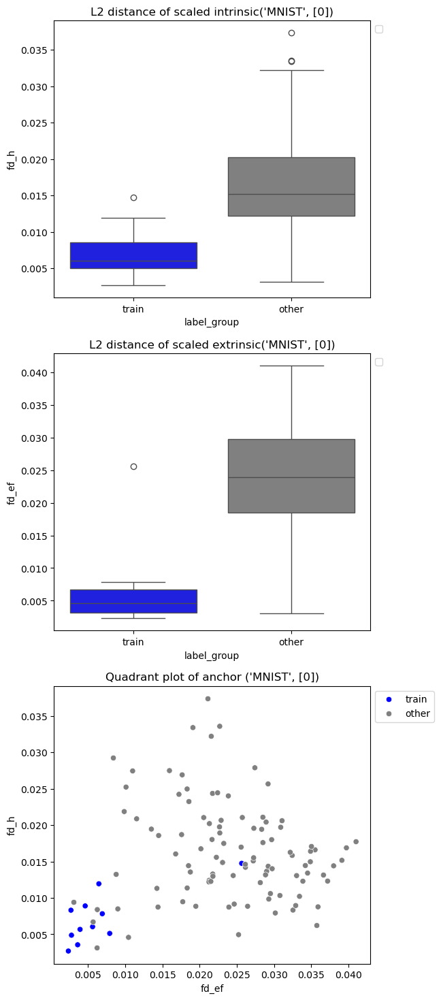

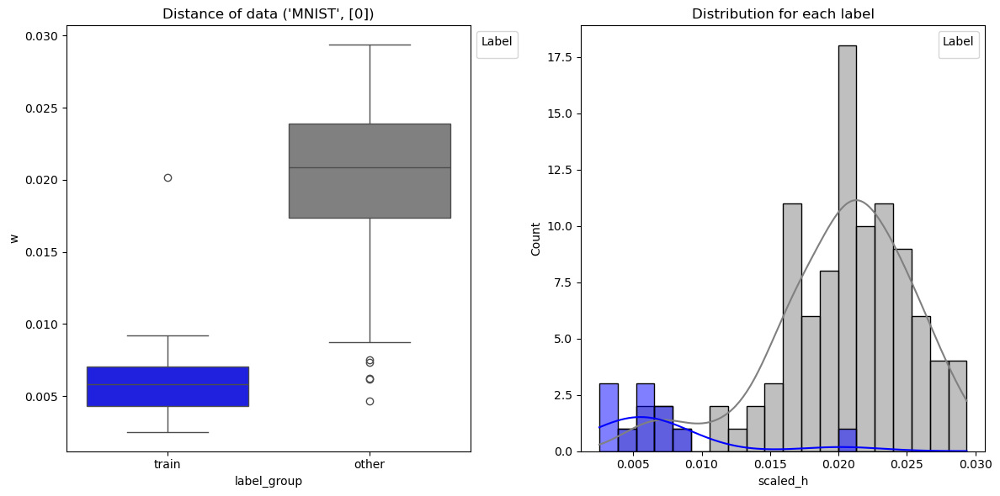

In [5]:
for dis_metric in ['L2']:
    args.metric = dis_metric
    print(f'Distance Metric {args.metric} Computing ... start')
    t_exp2 = t_Experiment_2(args, model_config, df_anchor, metric=args.metric)
    train_mean_anchor = t_exp2.anchor_train_mean_df
    t_exp2.plot_sim()

    print("experiment 2 Done ......")

    t_exp3 = t_Experiment_3(args, model_config, t_exp2.anchor_train_mean_df, t_exp2.anchor_test_mean_df)
    t_exp3.plot()

In [7]:
exp2.anchor_train_mean_df

,idx,label,scaled_h,scaled_ef_inversion,fd_h,fd_ef
0,0,train,0.337875,0.348391,0.574208,0.567357
1,1,train,0.429899,0.401612,0.569338,0.519779
2,2,train,0.512627,0.490551,0.772808,0.631457
3,3,train,0.350679,0.341519,0.776357,0.570465
4,4,train,0.503134,0.579081,0.777904,0.877976
...,...,...,...,...,...,...
996,996,train,0.402482,0.409620,0.707409,0.525454
997,997,train,0.376021,0.476789,0.555083,0.600160
998,998,train,0.243738,0.459689,0.834462,0.559125
999,999,train,0.300909,0.537713,0.753410,0.745686


In [6]:
(exp2.e_mean + 2 * exp2.e_var )* 0.5 + (exp2.i_mean + 2 * exp2.i_var) * 0.5

0.28741627126593317

Files already downloaded and verified
Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.8545961..0.94661176].


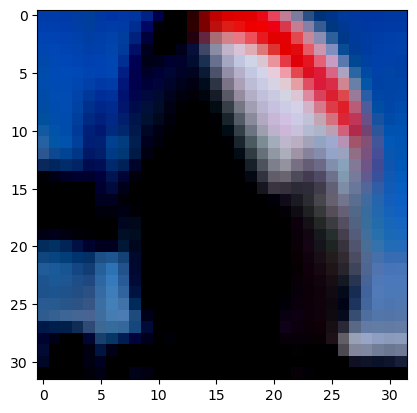

In [4]:
dt_train = CUSTOM_DATASET(args, split=True)
train_dataset, _ = dt_train.load_dataset(custom_trasform=True)
plt.imshow(train_dataset[12][0].permute(1,2,0))

In [6]:
train_dataset[12][0].shape

torch.Size([3, 32, 32])

In [ ]:
dt_train = CUSTOM_DATASET(args, split=True)
train_dataset, _ = dt_train.load_dataset(custom_trasform=True)


AttributeError: 'Subset' object has no attribute 'to'

In [5]:
for i in range(1):
    args = set_args()
    args.split_class = [i]
    
    seed_everything(args.seed) 


    """Merge both these"""
    model_config = set_config(args, custom_dataset=args.dataset) 
    model, sampler, trainer = model_init(args, model_config)
    
    i_data, e_data = get_sample_h_space_and_xt(args, model_config)
    


Config : MNIST
Config : haha
loading model : 0_ckpt_30_.pt ......


c:\Users\user\Desktop\DDPM_XAI\Utils.py:799: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(os.path.join(


model load weight done.
update Sampler ...... done
update Trainer ...... done


c:\Users\user\Desktop\DDPM_XAI\Utils.py:35: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(os.path.join(


model load weight done.


In [ ]:

i_data[0].shape

torch.Size([80, 512, 4, 4])

In [84]:
with torch.no_grad():
    s_size = e_data[0].shape[0]
    e_dis_lst = []
    i_dis_lst = []
    
    for i in range(s_size):
        e_dis = 0
        i_dis = 0
        mse_loss = nn.MSELoss()
        
        for j in range(80):
            train_dt = train_dataset[j][0].to(model_config['device'])
            #for intrinsic_j in [0, 200, 400, 600, 800]:
                #i_dis += mse_loss(i_data[intrinsic_j][i], )
            e_dis += mse_loss(e_data[0][i], train_dt)
        e_dis = e_dis.cpu().numpy()
        e_dis_lst.append(e_dis / 80)
    i_asterisk =  np.argmin(e_dis_lst)
    
    optimal_loss = []
    for round in range(80):
        train_dt = train_dataset[round][0].to(model_config['device'])
        loss = mse_loss(e_data[0][i_asterisk], train_dt)
        optimal_loss.append(loss.cpu().numpy())
    
    mu, sigma = np.mean(optimal_loss), np.var(optimal_loss)


In [15]:
np.argmin([3,4,5,6,1])

4

In [4]:
df_t = exp2.anchor_train_mean_df

In [12]:
df_t.iloc[df_t['fd_h'].idxmin():df_t['fd_h'].idxmin()+1]

,idx,label,scaled_h,scaled_ef_inversion,fd_h,fd_ef
132,132,train,0.296884,0.327349,0.152711,0.200215


In [14]:
reduced_percentile = 0.04

dt_train = CUSTOM_DATASET(args, split=True)
train_dataset, _ = dt_train.load_dataset(custom_trasform=True)


# Align the number of each group dataset
HIHE_len = len(reduced_sort_idx) * 0.35
subset_size = int(HIHE_len * (reduced_percentile * stage))  # Ensure the same size for all modes

dt = CUSTOM_DATASET(args)
train_dataset, test_dataset = dt.load_dataset()

np.random.choice(len(reduced_sort_idx), int(len(train_dataset) - subset_size))

array([63, 29,  8, ..., 67, 69, 47])

In [ ]:
"""
args.load_different_model = True
modelConfig = set_config(args)

device = torch.device(modelConfig["device"])
model_M = UNet(T=modelConfig["T"], ch=modelConfig["channel"], ch_mult=modelConfig["channel_mult"], attn=modelConfig["attn"],
                num_res_blocks=modelConfig["num_res_blocks"], dropout=0.)
args.rd = int(0)
"""
"""Modify in different enviornment"""
"""
ckpt_M = torch.load(os.path.join(
                modelConfig["save_weight_dir"], 'HIHE_' + modelConfig["test_load_weight"]), map_location=device)
#print(f' {os.path.join(modelConfig["save_weight_dir"], 'HIHE_' + modelConfig["test_load_weight"])}')
model_M.load_state_dict(ckpt_M)
print("model_M load weight done.")
model_M.eval()
sampler_M = GaussianDiffusionSampler(
    model_M, modelConfig["beta_1"], modelConfig["beta_T"], modelConfig["T"]).to(device)

with torch.no_grad():
    model_M.eval()
    noisyImage_M = torch.randn(
    size=[256, 3, 32, 32], device="cuda")
    saveNoisy_M = torch.clamp(noisyImage_M * 0.5 + 0.5, 0, 1)
    sampledImgs_M = sampler(saveNoisy_M)
"""
args.load_different_model = True
args.load_rd_training_checkpoint = 150
modelConfig = set_config(args)

FID_HIHE = []
FID_Other = []
FID_Random = []
FID_rd = []


FID_HIHE_M = []
FID_Other_M = []
FID_Random_M = []
FID_rd_M = []

fid_dt_train = CUSTOM_DATASET(args, split=True)
fid_train_dataset, _ = fid_dt_train.load_dataset(custom_trasform=True)

dt_loader = DataLoader(fid_train_dataset, batch_size=args.batch_size, shuffle=False)

for dt, i in dt_loader:
    break #init dt

real = dt
real_M = torch.Tensor().to(modelConfig["device"])
fake = torch.Tensor().to(modelConfig["device"])

for i in [0,20]:
    for round in range(3):
        args.rd = float(i * 0.05)
        FID_rd.append(int(args.rd)*100)
        FID_rd_M.append(int(args.rd)*100)
        
        for mode in ["HIHE", 'Other', 'Random']:
            args.load_different_model = True
            modelConfig = set_config(args)

            with torch.no_grad():
                device = torch.device(modelConfig["device"])
                model = UNet(T=modelConfig["T"], ch=modelConfig["channel"], ch_mult=modelConfig["channel_mult"], attn=modelConfig["attn"],
                                num_res_blocks=modelConfig["num_res_blocks"], dropout=0.)

                """Modify in different enviornment"""
                ckpt = torch.load(os.path.join(
                    modelConfig["save_weight_dir"], f'{mode}_' + modelConfig["test_load_weight"]), map_location=device)
                model_par = os.path.join(
                    modelConfig["save_weight_dir"], f'{mode}_' + modelConfig["test_load_weight"])
                print(f'Loading : {model_par}')
                model_par = os.path.join(
                    modelConfig["save_weight_dir"], f'{mode}_' + modelConfig["test_load_weight"])
                print(model_par)
                model.load_state_dict(ckpt)
                #print(f'Loading Model : {os.path.join(
                    #modelConfig["save_weight_dir"], f'{mode}_' + modelConfig["test_load_weight"])}')
                print("model load weight done.")
                model.eval()
                sampler = GaussianDiffusionSampler(
                    model, modelConfig["beta_1"], modelConfig["beta_T"], modelConfig["T"]).to(device)
                

            args.load_different_model = False

            """
            Some bugs need to be fixed here :
            sampling time became longer after training process.
            after gc.collect() still doesn't work.
            """
            for f_s_round in range(25):
                print(f"Sampling ...... f_s_round : {f_s_round}")
                with torch.no_grad():
                    model.eval()
                    noisyImage = torch.randn(
                    size=[model_config["batch_size"], 3, 32, 32], device="cuda")
                    saveNoisy = torch.clamp(noisyImage * 0.5 + 0.5, 0, 1)
                    sampledImgs = sampler(noisyImage)
                    fake = torch.concat([fake,sampledImgs], dim=0)
                
            if i == 0 and round == 0 and mode == 'HIHE':
                for s_round in range(25):
                    print(f"Sampling ..... round : {s_round}")
                    with torch.no_grad():
                        tmp = sampler(noisyImage)
                        real_M = torch.concat((real_M, tmp), dim=0)
                
            fake = sampledImgs
            fretchet_dist = calculate_fretchet(real,fake,InceptionV3_model) 
            fretchet_dist_M = calculate_fretchet(real_M,fake,InceptionV3_model) 
            print(f'mode : {fretchet_dist}')

            if mode == "HIHE":
                FID_HIHE.append(fretchet_dist)
                FID_HIHE_M.append(fretchet_dist_M)
            if mode == "Other":
                FID_Other.append(fretchet_dist)
                FID_Other_M.append(fretchet_dist_M)
            if mode == "Random":
                FID_Random.append(fretchet_dist)
                FID_Random_M.append(fretchet_dist_M)



Config : haha
Config : haha


C:\Users\user\AppData\Local\Temp\ipykernel_12056\3197012710.py:71: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(os.path.join(


Loading : Result/CheckpointsMNIST/HIHE_rd0_c0_ckpt_150_.pt
Result/CheckpointsMNIST/HIHE_rd0_c0_ckpt_150_.pt
model load weight done.
Sampling ...... f_s_round : 0
Timestep 999 add to h space information and xt information.
Timestep 998 add to h space information and xt information.
Timestep 997 add to h space information and xt information.
Timestep 996 add to h space information and xt information.
Timestep 995 add to h space information and xt information.
Timestep 994 add to h space information and xt information.
Timestep 993 add to h space information and xt information.
Timestep 992 add to h space information and xt information.
Timestep 991 add to h space information and xt information.
Timestep 990 add to h space information and xt information.
Timestep 989 add to h space information and xt information.
Timestep 988 add to h space information and xt information.
Timestep 987 add to h space information and xt information.
Timestep 986 add to h space information and xt information

In [ ]:
FID_HIHE

[36.99643675567046,
 44.21001332871373,
 40.25780278859452,
 40.02821193129864,
 44.40981058642623,
 39.51864228881317]

In [ ]:
FID_Other

[41.37718901401587,
 43.69138975264626,
 44.324435076036195,
 40.85292802631322,
 42.24844343248128,
 40.98841090023596]

In [ ]:
FID_Random

[44.62403624357805,
 40.47862241864226,
 43.31723566968452,
 41.236070294326964,
 39.68495817972196,
 42.34637282312897]

In [ ]:
FID_rd_M = [0,0,0,7,7, 7]

In [ ]:
#red_percentage = np.array([0, 5, 10, 15, 20, 25, 30]).astype(int)

FID_rec = pd.DataFrame([FID_HIHE, FID_HIHE_M, FID_Other, FID_Other_M, FID_Random, FID_Random_M, FID_rd_M]).T
FID_rec.columns = ['FID_HIHE', 'FID_HIHE_M', 'FID_Other', 'FID_Other_M', 'FID_Random', 'FID_Random_M', 'red_stage']
df_melted = FID_rec.melt(id_vars=["red_stage"], var_name="FID Type", value_name="FID Value")


In [ ]:
df_melted_cmp_original = df_melted[df_melted["FID Type"].isin(["FID_HIHE", "FID_Other", "FID_Random"])]
df_melted_cmp_M = df_melted[df_melted["FID Type"].isin(["FID_HIHE_M", "FID_Other_M", "FID_Random_M"])]


In [ ]:
df_melted_cmp_M

,red_stage,FID Type,FID Value
6,0.0,FID_HIHE_M,25.506344
7,0.0,FID_HIHE_M,26.042951
8,0.0,FID_HIHE_M,27.005411
9,7.0,FID_HIHE_M,28.416227
10,7.0,FID_HIHE_M,27.553745
11,7.0,FID_HIHE_M,26.657147
18,0.0,FID_Other_M,25.912286
19,0.0,FID_Other_M,25.962232
20,0.0,FID_Other_M,23.699602
21,7.0,FID_Other_M,25.490800


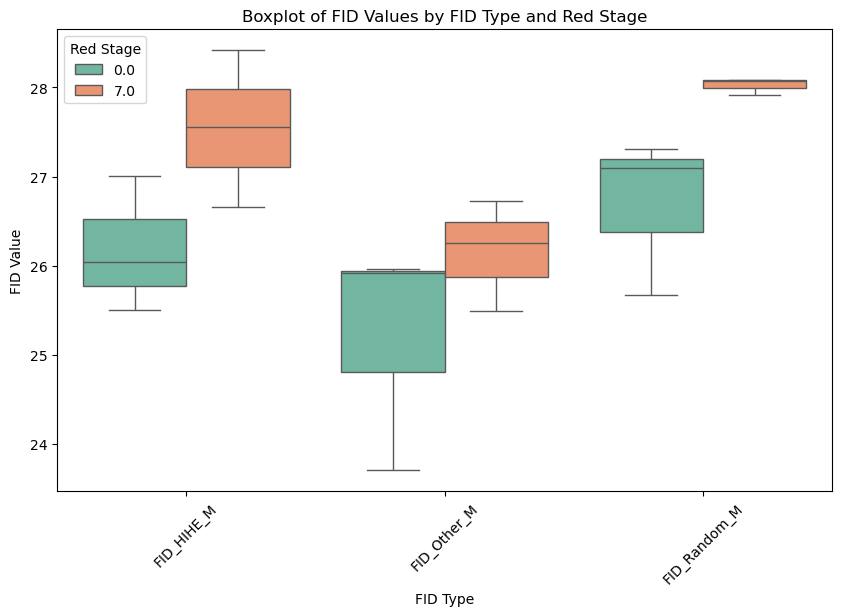

In [ ]:
# Creating the boxplot using seaborn
plt.figure(figsize=(10, 6))

sns.boxplot(
    data=df_melted_cmp_M,
    x="FID Type",
    y="FID Value",
    hue="red_stage",
    palette="Set2"
)

plt.title("Boxplot of FID Values by FID Type and Red Stage")
plt.xlabel("FID Type")
plt.ylabel("FID Value")
plt.legend(title="Red Stage")
plt.xticks(rotation=45)
plt.show()


In [14]:
# Create a fancy relplot
plt.figure(figsize=(10, 6))
sns.lineplot(data=df_melted_cmp_original, x="red_percentage", y="FID Value", hue="FID Type", marker="o", linewidth=2.5)

# Customize plot aesthetics
plt.xlabel("Red Percentage", fontsize=14, fontweight='bold')
plt.ylabel("FID Values", fontsize=14, fontweight='bold')
plt.title("Relationship between Reduce Percentage and FID Values", fontsize=16, fontweight='bold')
plt.legend(title="FID Type", title_fontsize=12, fontsize=10)
plt.xticks(red_percentage, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle="--", alpha=0.6)

# Show the plot
plt.show()



ValueError: Could not interpret value `red_percentage` for `x`. An entry with this name does not appear in `data`.

<Figure size 1000x600 with 0 Axes>

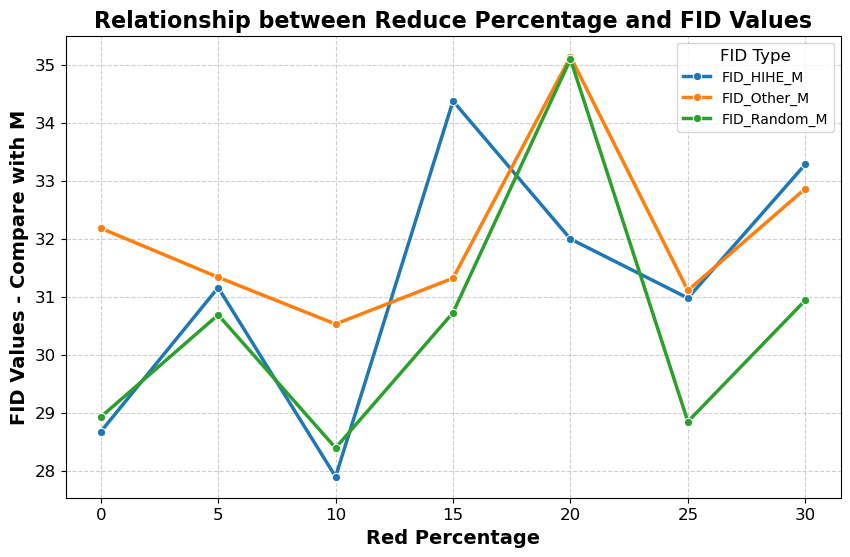

In [7]:
# Create a fancy relplot
plt.figure(figsize=(10, 6))
sns.lineplot(data=df_melted_cmp_M, x="red_percentage", y="FID Value", hue="FID Type", marker="o", linewidth=2.5)

# Customize plot aesthetics
plt.xlabel("Red Percentage", fontsize=14, fontweight='bold')
plt.ylabel("FID Values - Compare with M", fontsize=14, fontweight='bold')
plt.title("Relationship between Reduce Percentage and FID Values", fontsize=16, fontweight='bold')
plt.legend(title="FID Type", title_fontsize=12, fontsize=10)
plt.xticks(red_percentage, fontsize=12)
plt.yticks(fontsize=12)
plt.grid(True, linestyle="--", alpha=0.6)

# Show the plot
plt.show()

In [7]:
#rd_model, rd_sampler, rd_trainer = model_init(args, model_config, rd=True)
#fake = generate_sameple_img(args, model_config, rd_model, rd_sampler)


"""
with torch.no_grad():
    model.eval()
    noisyImage = torch.randn(
    size=[model_config["batch_size"], 3, 32, 32], device="cuda")
    saveNoisy = torch.clamp(noisyImage * 0.5 + 0.5, 0, 1)
    sampledImgs = rd_sampler(noisyImage)
"""
fake = sampledImgs

fid_dt_train = CUSTOM_DATASET(args, split=True)
fid_train_dataset, _ = fid_dt_train.load_dataset(custom_trasform=True)

dt_loader = DataLoader(fid_train_dataset, batch_size=fake.shape[0], shuffle=False)

for dt, i in dt_loader:
    print(dt.shape)
    break

real = dt
fretchet_dist = calculate_fretchet(real,fake,InceptionV3_model) 

KeyboardInterrupt: 

In [6]:
fretchet_dist

69.63400291726376

In [4]:
reduced_percentile = 0.04

dt_train = CUSTOM_DATASET(args, split=True)
train_dataset, _ = dt_train.load_dataset(custom_trasform=True)


# Align the number of each group dataset
HIHE_len = len(reduced_sort_idx) * 0.25
subset_size = int(HIHE_len * (1 - reduced_percentile * stage))  # Ensure the same size for all modes

for reduce_mode in ['HIHE', 'Other', 'Random']:
    #for round in range(10):
    if reduce_mode == 'HIHE':
        reduced_data = Subset(train_dataset, list(reduced_sort_idx[:subset_size]))
    if reduce_mode == 'Other':
        reduced_data = Subset(train_dataset, list(reduced_sort_idx[-subset_size:]))
    if reduce_mode == 'Random':
        random_indices = np.random.choice(len(reduced_sort_idx), subset_size, replace=False)
        random_indices_arr = reduced_sort_idx[random_indices]
        reduced_data = Subset(train_dataset, random_indices_arr)

NameError: name 'reduced_sort_idx' is not defined

In [10]:
reduced_sort_idx

array([ 114, 2956, 2546, ..., 2816, 3405, 3293], dtype=int64)

In [7]:
train_mean_anchor

,idx,label,scaled_h,scaled_ef_inversion,fd_h,fd_ef
0,0,train,0.221093,0.507086,0.263851,0.389556
1,1,train,0.362980,0.490500,0.198949,0.355486
2,2,train,0.354381,0.485490,0.180239,0.373786
3,3,train,0.306864,0.498539,0.332577,0.380612
4,4,train,0.318964,0.465728,0.180777,0.374146
...,...,...,...,...,...,...
3996,3996,train,0.238334,0.476684,0.235583,0.476311
3997,3997,train,0.279995,0.486525,0.202313,0.392131
3998,3998,train,0.408594,0.509935,0.233167,0.394157
3999,3999,train,0.348559,0.518587,0.250119,0.398875


In [8]:
df_anchor_mean = train_mean_anchor.groupby(['idx'])[['scaled_ef_inversion','scaled_h']].mean().reset_index()
df_anchor_mean['weight'] = (df_anchor_mean['scaled_ef_inversion'] * 0.2 + df_anchor_mean['scaled_h'] * 0.8)
    
df_anchor_mean = df_anchor_mean.sort_values(by='weight')

In [30]:
with torch.no_grad():
    device = torch.device(modelConfig["device"])
    model = UNet(T=modelConfig["T"], ch=modelConfig["channel"], ch_mult=modelConfig["channel_mult"], attn=modelConfig["attn"],
                    num_res_blocks=modelConfig["num_res_blocks"], dropout=0.)

    """Modify in different enviornment"""
    ckpt = torch.load(os.path.join(
        modelConfig["save_weight_dir"], f'{mode}_' + modelConfig["test_load_weight"]), map_location=device)
    model.load_state_dict(ckpt)
    #print(f'Loading Model : {os.path.join(
        #modelConfig["save_weight_dir"], f'{mode}_' + modelConfig["test_load_weight"])}')
    print("model load weight done.")
    model.eval()
    sampler = GaussianDiffusionSampler(
        model, modelConfig["beta_1"], modelConfig["beta_T"], modelConfig["T"]).to(device)
    
    noisyImage_M = torch.randn(
    size=[256, 3, 32, 32], device="cuda")
    saveNoisy_M = torch.clamp(noisyImage_M * 0.5 + 0.5, 0, 1)
    sampledImgs_M = sampler(saveNoisy_M)
    real_M = sampledImgs_M

args.load_different_model = False

C:\Users\user\AppData\Local\Temp\ipykernel_516\2601672158.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(os.path.join(


model load weight done.
Timestep 999 add to h space information and xt information.
Timestep 998 add to h space information and xt information.
Timestep 997 add to h space information and xt information.
Timestep 996 add to h space information and xt information.
Timestep 995 add to h space information and xt information.
Timestep 994 add to h space information and xt information.
Timestep 993 add to h space information and xt information.
Timestep 992 add to h space information and xt information.
Timestep 991 add to h space information and xt information.
Timestep 990 add to h space information and xt information.
Timestep 989 add to h space information and xt information.
Timestep 988 add to h space information and xt information.
Timestep 987 add to h space information and xt information.
Timestep 986 add to h space information and xt information.
Timestep 985 add to h space information and xt information.
Timestep 984 add to h space information and xt information.
Timestep 983 add

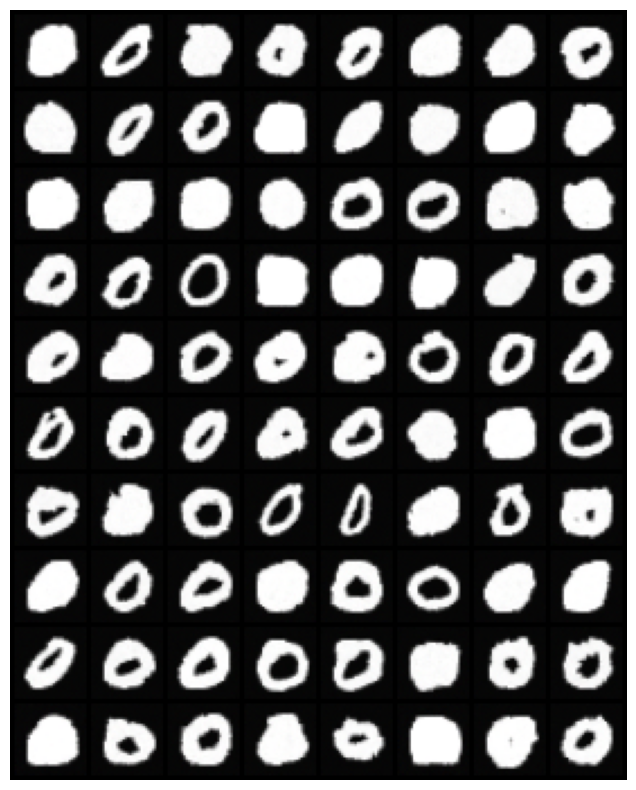

In [47]:
grid = vutils.make_grid(real_M, nrow=8, normalize=True)

# Convert to NumPy for visualization
plt.figure(figsize=(10,10))
plt.imshow(grid.permute(1, 2, 0).cpu().numpy())  # Convert from (C, H, W) to (H, W, C)
plt.axis('off')
plt.show()

In [32]:
fretchet_dist_M = calculate_fretchet(real_M,fake,InceptionV3_model) 
print(fretchet_dist_M)

95.85454871111492


In [33]:
os.path.join(
    modelConfig["save_weight_dir"], modelConfig["test_load_weight"])

'Result/CheckpointsMNIST/rd0_c0_ckpt_150_.pt'

In [34]:
os.path.join(
        modelConfig["save_weight_dir"], f'{mode}_' + modelConfig["test_load_weight"])

'Result/CheckpointsMNIST/Random_rd0_c0_ckpt_150_.pt'

In [37]:
os.path.join(
                modelConfig["save_weight_dir"], f'{mode}_' + modelConfig["test_load_weight"])

'Result/CheckpointsMNIST/Random_rd0_c0_ckpt_150_.pt'

In [4]:
real_M.shape

torch.Size([80, 3, 32, 32])

In [23]:
tmp = torch.concat((tmp, real_M), dim=0)

In [24]:
tmp.shape

torch.Size([80, 3, 32, 32])

In [21]:
tmp = torch.Tensor().to(device)

In [22]:
tmp

tensor([], device='cuda:0')